 - Andrea Cristiano 0001122124

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

In [9]:
# from google.colab import drive
# drive.mount('/content/drive')

# !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
# !unzip dataset.zip

In [33]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import skimage.morphology as sk
import re
import random

In [11]:
laplacian_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Preprocessing

- Creation of auxiliary arrays to browse trough the photos
- Denoising of Scene photos 

## Denoising

### auxiliary function
This function takes care of extracting the number of the input path which is passed to the function. This will be used later on when we generate a folder in the dataset containing all the denoised images. 

In [12]:
def extract_number(string):
    # Using regex to find numbers in the string
    numbers = re.findall(r'\d+', string)
    # Returning the first number found (if any)
    return int(numbers[0]) if numbers else None

This function denoises the image in the following steps: 
- extract the image path
- read the image and convert it in RGB
- apply **median blur** to remove some of the noise in the image, using a 5x5 kernel. The median filter is useful in removing "salt and pepper" noise
- apply **gaussian blur** with a 5x5 kernel and a standard deviation of 1. This is done to reduce high-frequency noise. 
- apply **fast non-local means denoising** which is specialized in removing noise from a colored image. It removes noise while retaining the colours and edges
- apply a **laplacian fiter** with the previously defined laplacian kernel. This should highlight the edges and small details by enhancing the areas where we have a sudden change in colour
- convert back to BGR. 

In [66]:
def denoise_image(img_path):
  
  img_index = extract_number(img_path)
  img= cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.medianBlur(img, 5)
  img = cv2.GaussianBlur(img, (5,5), 1)
  img = cv2.fastNlMeansDenoisingColored(img, None, 12, 12, 7, 21)
  img = cv2.filter2D(img, -1, laplacian_kernel)
  img_write = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

  cv2.imwrite(f'./dataset/scenes/scene{img_index}_dn.png', img_write)
  

In [14]:
## SCENE ARRAYS CREATION
scenes_path = './dataset/scenes/scene'

scene_idx_start_a = 1
scene_idx_end_a = 5
scene_idx_start_b = 6
scene_idx_end_b = 12

scenes_a = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
scenes_b = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]

In [15]:
#SCENE DENOISING
for scene in scenes_a:
    denoise_image(scene)
for scene in scenes_b:
    denoise_image(scene)

In [16]:
#DENOISED SCENES ARRAYS
dn_scenes_path = './dataset/denoised_scenes/scene'
dn_scenes_a = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
dn_scenes_b = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]

#MODELS ARRAYS CREATION
models_path = './dataset/models/ref'

start_index_a = 1
end_index_a = 14
start_index_b = 15
end_index_b = 27

objs_a = [f"{models_path}{i}.png" for i in range(start_index_a, end_index_a )]
objs_b = [f"{models_path}{i}.png" for i in range(start_index_b, end_index_b )]

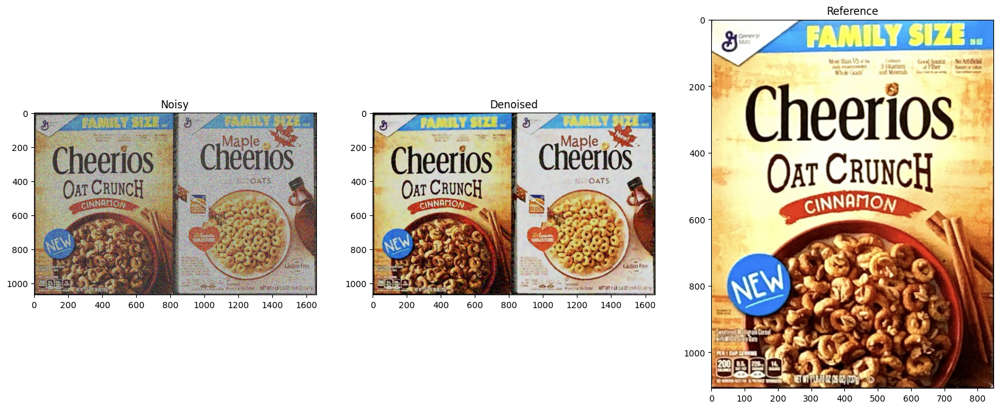

In [17]:
#show noisy vs denoised
scene1_img = cv2.imread(scenes_a[0])
scene1_rgb = cv2.cvtColor(scene1_img, cv2.COLOR_BGR2RGB)

scene1dn_img = cv2.imread(dn_scenes_a[0])
scene1dn_rgb = cv2.cvtColor(scene1dn_img, cv2.COLOR_BGR2RGB)

obj_image = cv2.imread('./dataset/models/ref1.png')
obj_rgb = cv2.cvtColor(obj_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.title('Noisy')
plt.imshow(scene1_rgb)

plt.subplot(1,3,2)
plt.title('Denoised')
plt.imshow(scene1dn_rgb)

plt.subplot(1,3,3)
plt.title('Reference')
plt.imshow(obj_rgb)

plt.show()

## Color histogram

references:
- https://www.pinecone.io/learn/series/image-search/color-histograms/
- https://zilliz.com/learn/demystifying-color-histograms
- https://pyimagesearch.com/2021/04/28/opencv-image-histograms-cv2-calchist/

We decided to compute also the color histograms instead of only using sift because this method is extremely good in retrieval when dealing with colored images, which is our case. Color histograms are one of the first Content-Based Image Retrieval (CBIR), which focuses on comparing the content of the image instead of its metadata.  A color histogram counts the number of times a given pixel intensity (or range of pixel intensities) occurs in an image We added this as the results with only sift were satisfactory but not enough, as they were either detecting too much or not enough in the scenes.

In [18]:
def compute_color_histogram(image, bins=(8, 8, 8)):
    # Convert the image to the HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Compute the histogram and normalize it
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist)

    return hist

The following are functions which are used to plot and visualize the histogram in order to understand better how they work. 

In [19]:
def plot_histogram(hist, title, color_space='HSV'):
    # Plotting the histogram for the three channels
    plt.figure()
    plt.title(title)
    plt.xlabel("Bins")
    plt.ylabel("Frequency")

    colors = ('b', 'g', 'r')
    for i, color in enumerate(colors):
        plt.plot(hist[i], color=color)
    plt.show()

def visualize_histograms(img_obj, roi_train):
    # Compute histograms
    hist_query = compute_color_histogram(img_obj)
    hist_roi_train = compute_color_histogram(roi_train)

    # Visualize histograms
    plot_histogram(hist_query, "Histogram for Query Image")
    plot_histogram(hist_roi_train, "Histogram for ROI in Train Image")


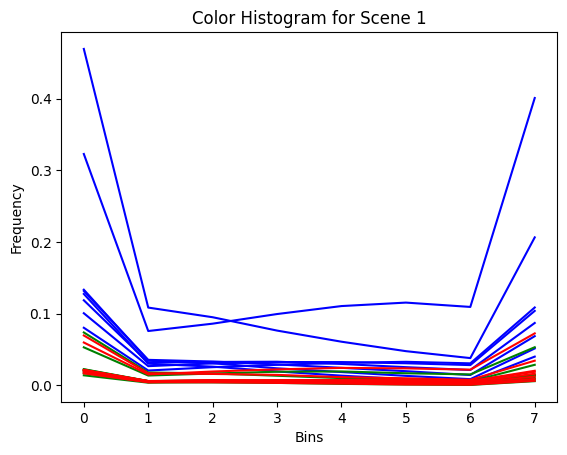

In [70]:
# Load image
image = cv2.imread('./dataset/scenes/scene1.png')

# Compute the histogram
hist = compute_color_histogram(image)

# Plot the histogram
plot_histogram(hist, title="Color Histogram for Scene 1", color_space='HSV')

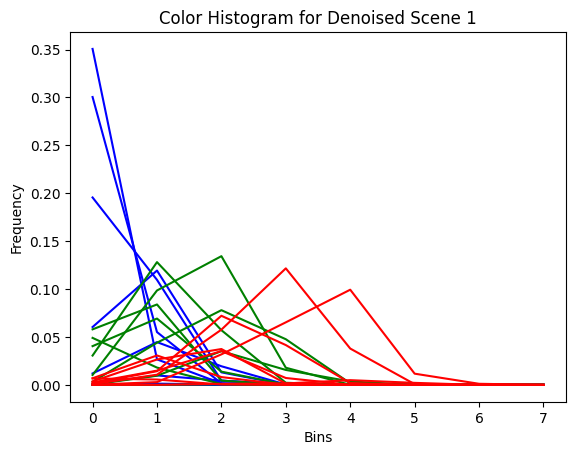

In [69]:
# Load image
image = cv2.imread('./dataset/scenes/scene1_dn.png') 

# Compute the histogram
hist = compute_color_histogram(image)

# Plot the histogram
plot_histogram(hist, title="Color Histogram for Denoised Scene 1", color_space='HSV')

# Track A

To solve this track we use sift and flann to perform the matching. They are declared below. 

In [21]:
sift = cv2.xfeatures2d.SIFT_create()
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

[ WARN:0@8.759] global shadow_sift.hpp:15 SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


The *show_matches* function visually displays a background image overlaid with bounding boxes indicating detected objects. It also displays the corresponding object images side by side for easy reference. 

In [ ]:
def show_matches(background, instances):
    '''
    Displays the background image with bounding boxes around detected objects 
    and shows unique object images with matching colored rectangles.

    Parameters:
        background (ndarray): The denoised background image.
        instances (list): Array containing elements structured like:
            [height, width, position[], img]
            - height: Height of the bounding box.
            - width: Width of the bounding box.
            - position: [x, y] coordinates of the top-left corner.
            - img: Object image (ndarray).
    '''
    img_scene = background.copy()

    # Track unique objects and assign colors
    unique_objects = {}
    for instance in instances:
        _, _, _, obj = instance
        obj_id = id(obj)  # Use a unique identifier for each image object
        if obj_id not in unique_objects:
            # Assign a random color for each unique object
            unique_objects[obj_id] = {
                "img": obj,
                "color": (
                    random.randint(0, 255),
                    random.randint(0, 255),
                    random.randint(0, 255),
                ),
            }

    # Draw bounding boxes with unique colors on the background image
    for instance in instances:
        height, width, position, obj = instance
        obj_id = id(obj)
        top_left_x, top_left_y = int(position[0]), int(position[1])
        bottom_right_x = top_left_x + int(width)
        bottom_right_y = top_left_y + int(height)

        # Get the unique color for this object
        color = unique_objects[obj_id]["color"]

        # Draw rectangle on the background image
        img_scene = cv2.rectangle(
            img_scene,
            (top_left_x, top_left_y),
            (bottom_right_x, bottom_right_y),
            color,
            20,  # Rectangle thickness
        )

    # Set up the plot with subplots
    n = len(unique_objects) + 1
    plt.figure(figsize=(20, 5))

    # Show the background image with bounding boxes as the first subplot
    plt.subplot(1, n, 1)
    plt.imshow(img_scene)  # Convert BGR to RGB
    plt.title("Background with Bounding Boxes")

    # Show each unique object image in its own subplot
    for i, obj_data in enumerate(unique_objects.values()):
        obj = obj_data["img"]
        color = obj_data["color"]

        # Add a rectangle to the object image
        obj_with_border = obj.copy()
        height, width, _ = obj_with_border.shape
        obj_with_border = cv2.rectangle(
            obj_with_border,
            (0, 0),
            (width - 1, height - 1),  # Draw border around the entire image
            color,
            40,  # Rectangle thickness
        )

        # Display object image with a colored rectangle in a subplot
        plt.subplot(1, n, i + 2)
        plt.imshow(obj_with_border) 

    plt.show()

This other function draws the bounding box in the image. It also performs the similarity check using the histogram method referenced above. 

In [61]:
def draw_boxes(kp_obj, kp_scene, obj, scene, good, scene_ind, obj_ind):
    
    """
    Draw bounding boxes and save information for each instance of the query found in the train image.

    Parameters:
        kp_obj (list): Keypoints of the object image.
        kp_scene (list): Keypoints of the scene image.
        img_obj (ndarray): Object (query) image.
        img_scene (ndarray): Scene (train) image.
        good (list): Good matches after Lowe's ratio test.
        scene_ind (int): Index of the scene being processed.
        obj_ind (int): Index of the object being processed.

    Returns:
        tuple: Processed train image and a list of instance data.
    """
    img_obj = obj.copy()
    img_scene = scene.copy()

    # Correspondences from good matches
    src_pts = np.float32([kp_obj[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Estimate robust homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    # Corners of the query image
    h, w = img_obj.shape[:2]
    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)

    # Extract the bounding box
    coordinate = np.int32(dst).reshape(-1, 2)
    x, y, w, h = cv2.boundingRect(coordinate)

    # Extracting the center coordinates
    x_center = x + w // 2
    y_center = y + h // 2

    # Perform histogram similarity check for insufficient matches
    if len(good) < 100:
        roi_train = img_scene[y:y + h, x:x + w]
        if roi_train.size == 0:
            return -1

        hist_threshold = 0.2
        hist_query = compute_color_histogram(img_obj)
        hist_train_roi = compute_color_histogram(roi_train)
        similarity = cv2.compareHist(hist_query, hist_train_roi, cv2.HISTCMP_CORREL)

        if similarity < hist_threshold:
            return -1

    # Log instance details
    print(
        f"Instance {obj_ind} found in scene {scene_ind} at position: "
        f"({x_center}, {y_center}), width: {w}px, height: {h}px"
    )
    
    ret_array = [h, w, dst[0][0], img_obj]
    return ret_array

This is the function which actually performs the task by detecting the keypoints both in the scene and the object and finding the matches. Then, if the amount of matches is big enough (lowe's threshold), we use the draw_boxes function. 

In [24]:
def track_a(scene_original, obj_original, treshold, scene_index, obj_index):
    scene = scene_original.copy()
    obj = obj_original.copy()

    kp_scene = sift.detect(scene)
    kp_obj = sift.detect(obj)

    kp_scene, des_scene = sift.compute(scene, kp_scene)
    kp_obj, des_obj = sift.compute(obj, kp_obj)

    matches = flann.knnMatch(des_obj, des_scene, k=2)

    good_matches = []

    for m,n in matches:
        if m.distance < 0.7*n.distance:  
            good_matches.append(m)

    if len(good_matches)>treshold:

        ret_array = draw_boxes(kp_obj, kp_scene, obj, scene, good_matches, scene_index, obj_index)

        return ret_array
    else:
        return -1


Show the matches for all the scenes. 

Instance 1 found in scene 1 at position: (412, 539), width: 804px, height: 1050px
Instance 2 found in scene 1 at position: (1248, 533), width: 804px, height: 1049px


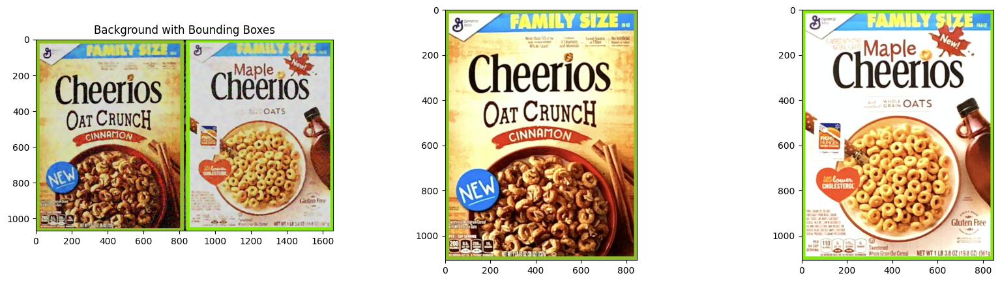

Instance 3 found in scene 2 at position: (306, 493), width: 606px, height: 942px
Instance 4 found in scene 2 at position: (927, 483), width: 633px, height: 951px
Instance 5 found in scene 2 at position: (1528, 450), width: 561px, height: 846px


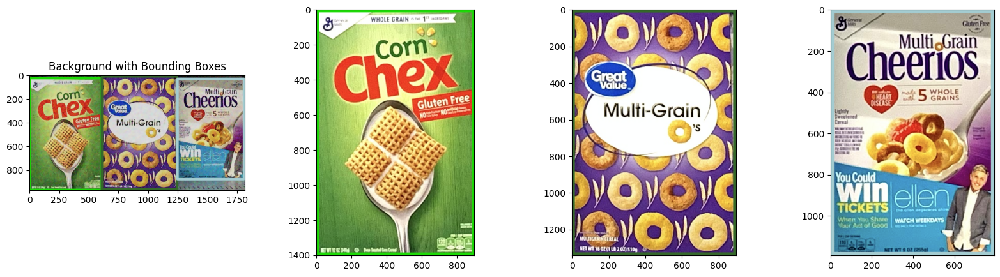

Instance 6 found in scene 3 at position: (299, 459), width: 602px, height: 672px
Instance 7 found in scene 3 at position: (888, 461), width: 544px, height: 652px
Instance 8 found in scene 3 at position: (1447, 397), width: 560px, height: 781px


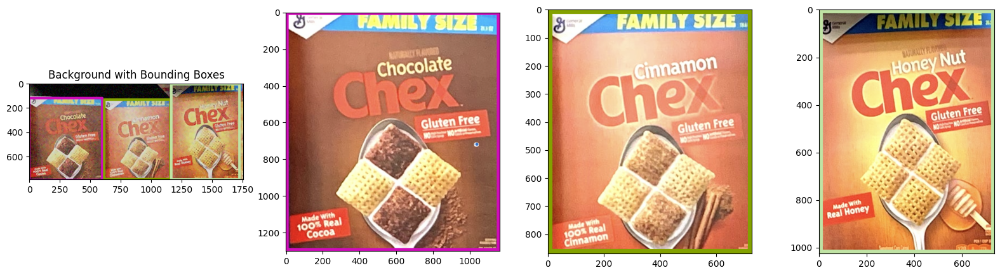

Instance 1 found in scene 4 at position: (887, 912), width: 383px, height: 515px
Instance 8 found in scene 4 at position: (350, 257), width: 350px, height: 490px


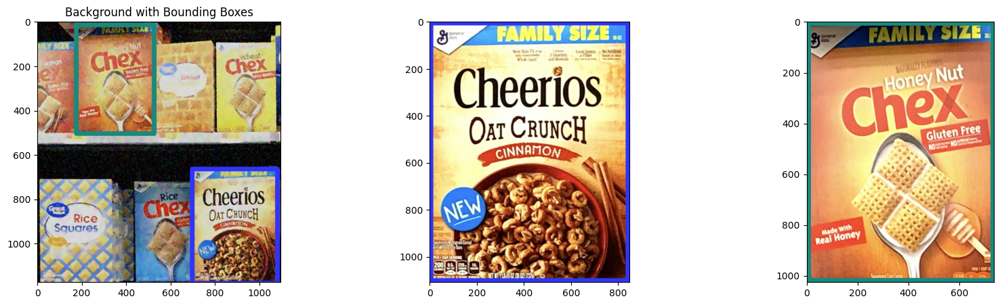

Instance 11 found in scene 5 at position: (368, 751), width: 368px, height: 555px
Instance 12 found in scene 5 at position: (714, 740), width: 442px, height: 659px


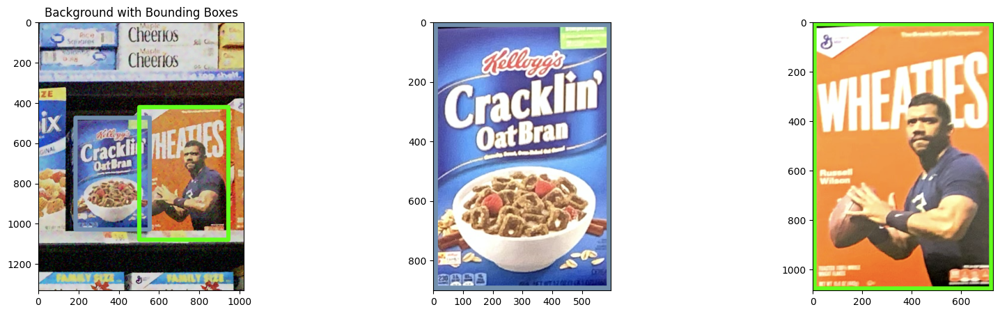

In [65]:
for scene_path in dn_scenes_a:
    objs_scenes=[]
    scene = cv2.imread(scene_path)
    scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
    scene_index = extract_number(scene_path)
    for obj_path in objs_a:
        obj = cv2.imread(obj_path)
        obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)
        obj_index = extract_number(obj_path)
        
        ret_array=track_a(scene, obj,60, scene_index, obj_index)
        if not(ret_array==-1 or len(ret_array) !=4):
            objs_scenes.append(ret_array)
    show_matches(background=scene, instances=objs_scenes)
        

# TRACK B

In [36]:
def draw_boxes_b(kp_obj, kp_scene, img_obj, img_scene, good, instances, ret_arrays):
    """
    Draws bounding boxes on detected objects and tracks the region of interest (ROI).
    
    Parameters:
        kp_obj (list): Keypoints in the query image.
        kp_scene (list): Keypoints in the train image.
        img_obj (ndarray): Query image.
        img_scene (ndarray): Train image.
        good (list): Good matches after ratio test.
        instances (list): List of detected instances (bounding boxes).

    Returns:
        tuple: Updated train image and set of ROI keypoint indices.
    """
    # Build the correspondences arrays of good matches
    src_pts = np.float32([kp_obj[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Estimate a robust homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Corners of the query image
    h, w = img_obj.shape[:2]
    pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)

    # Extracting the bounding box
    coordinate = np.int32(dst).reshape(-1, 2)
    x, y, w, h = cv2.boundingRect(coordinate)

    # Extract the ROI from the train image
    roi_train = img_scene[y:y + h, x:x + w]
    if roi_train.size == 0:
        return [], set()

    # Extract the indices of the keypoints in the scene within the ROI
    roi_indices = {
        i for i, kp in enumerate(kp_scene)
        if x <= kp.pt[0] < x + w and y <= kp.pt[1] < y + h
    }

    # Check if bounding box is valid
    height, width, _ = img_scene.shape
    if h > height or x < 0 or y < 0:
        return [], roi_indices

    # Compare histograms using correlation
    hist_threshold = 0.1
    hist_obj = compute_color_histogram(img_obj)
    hist_scene_roi = compute_color_histogram(roi_train)
    similarity = cv2.compareHist(hist_obj, hist_scene_roi, cv2.HISTCMP_CORREL)
    if similarity < hist_threshold:
        return [], roi_indices

    ret_array= [h, w, dst[0][0].tolist(), img_obj]
    ret_arrays.append(ret_array)
    # Record the detected instance
    instances.append({"width": w, "height": h, "x": x, "y": y})
    return img_scene, roi_indices

In [37]:
def lowe_ratio_test_track_b(matches, min_match_count, kp_obj, kp_scene, img_obj, img_scene, instances, ret_arrays):
    good = []

    # Collect the good matches by performing the lowe ratio test
    

    if len(good)>min_match_count:
        img_scene, good_kp = draw_boxes_b(kp_obj, kp_scene, img_obj, img_scene, good, instances, ret_arrays)
        if(len(img_scene) == 0):
          return -1, good_kp
        return len(good), good_kp
    else:
        return -1, set()

In [29]:
def object_retrieve_track_b(img_obj, img_scene, min_match_count, instances,ret_arrays, kp_scene = []):
    
    # If no keypoints are given compute keypoints for scene
    if len(kp_scene) == 0:
      kp_scene = sift.detect(img_scene)

    # Sift and detect for query and scene
    kp_obj = sift.detect(img_obj)
    kp_obj, des_query = sift.compute(img_obj, kp_obj)
    kp_scene, des_train = sift.compute(img_scene, kp_scene)
    
    matches = flann.knnMatch(des_query,des_train,k=2)

    found, good = lowe_ratio_test_track_b(matches, min_match_count, kp_obj, kp_scene, img_obj, img_scene, instances, ret_arrays)

    # Create a set of all indices in kp_scene
    all_train_indices = set(range(len(kp_scene)))

    # Subtract matched_train_indices (good) from all_train_indices
    unmatched_train_indices = all_train_indices - good

    # Retrieve the keypoints corresponding to the remaining indices
    unmatched_keypoints = [kp_scene[i] for i in unmatched_train_indices]

    return found, unmatched_keypoints, good

In [52]:
def obj_retrieve_b(img_obj, img_scene, min_match_count, instances,ret_arrays, kp_scene = []):

    # If no keypoints are given compute keypoints for scene
    if len(kp_scene) == 0:
      kp_scene = sift.detect(img_scene)

    # Sift and detect for query and scene
    kp_obj = sift.detect(img_obj)
    kp_obj, des_query = sift.compute(img_obj, kp_obj)
    kp_scene, des_train = sift.compute(img_scene, kp_scene)
    
    matches = flann.knnMatch(des_query,des_train,k=2)

    good = []

    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good)>min_match_count:
        img_scene, good = draw_boxes_b(kp_obj, kp_scene, img_obj, img_scene, good, instances, ret_arrays)
        if (len(img_scene)==0):
            found=-1
        found = len(good)
    else:
        found=-1
        good=set()

    #found, good = lowe_ratio_test_track_b(matches, min_match_count, kp_obj, kp_scene, img_obj, img_scene, instances, ret_arrays)

    # Create a set of all indices in kp_scene
    all_train_indices = set(range(len(kp_scene)))

    # Subtract matched_train_indices (good) from all_train_indices
    unmatched_train_indices = all_train_indices - good

    # Retrieve the keypoints corresponding to the remaining indices
    unmatched_keypoints = [kp_scene[i] for i in unmatched_train_indices]

    return found, unmatched_keypoints, good

In [44]:
def track_b(scene, obj, kp_scene, instances,ret_arrays, j):
    found, kp_scene, good = obj_retrieve_b(obj, scene, 13, instances,ret_arrays, kp_scene )

    while(len(good) > 10):
        found, kp_scene, good = obj_retrieve_b(obj, scene, 12, instances,ret_arrays, kp_scene )

    if(len(instances) > 0):

        print("Product {} - {} instance found:".format(j, len(instances)))
        for i, instance in enumerate(instances):
            print("  Instance {}  [position: ({}, {}), width: {}px, height: {}px]". format(i, instance['x'], instance['y'], instance['width'], instance['height']))

Product 15 - 2 instance found:
  Instance 0  [position: (419, 167), width: 328px, height: 907px]
  Instance 1  [position: (19, 166), width: 339px, height: 907px]


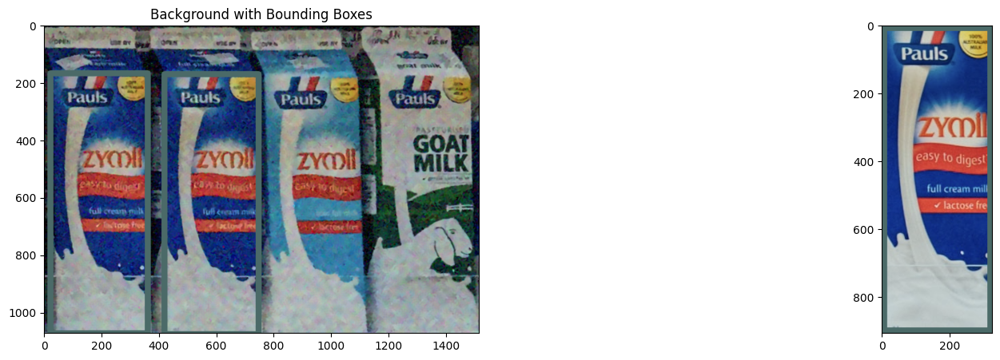

Product 16 - 2 instance found:
  Instance 0  [position: (915, 159), width: 230px, height: 603px]
  Instance 1  [position: (687, 159), width: 217px, height: 608px]


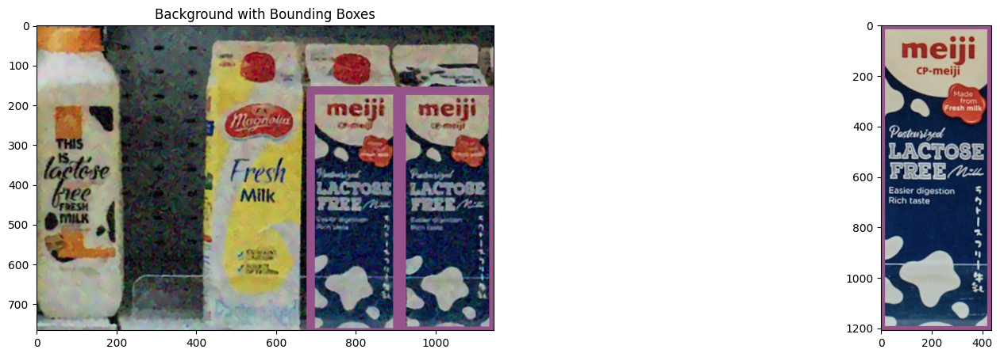

Product 17 - 3 instance found:
  Instance 0  [position: (485, 141), width: 328px, height: 854px]
  Instance 1  [position: (825, 148), width: 328px, height: 854px]
  Instance 2  [position: (1173, 150), width: 341px, height: 856px]
Product 18 - 1 instance found:
  Instance 0  [position: (52, 181), width: 412px, height: 816px]
Product 23 - 3 instance found:
  Instance 0  [position: (826, 131), width: 323px, height: 873px]
  Instance 1  [position: (486, 122), width: 322px, height: 874px]
  Instance 2  [position: (1176, 132), width: 327px, height: 872px]
Product 24 - 3 instance found:
  Instance 0  [position: (1173, 150), width: 328px, height: 857px]
  Instance 1  [position: (482, 144), width: 331px, height: 869px]
  Instance 2  [position: (821, 151), width: 330px, height: 856px]


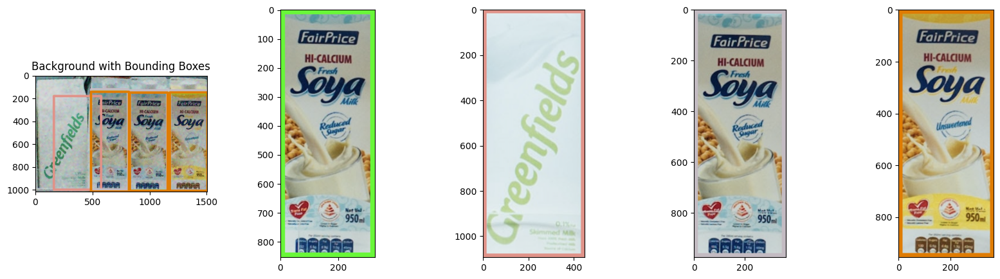

Product 19 - 2 instance found:
  Instance 0  [position: (508, 95), width: 226px, height: 559px]
  Instance 1  [position: (736, 90), width: 225px, height: 570px]


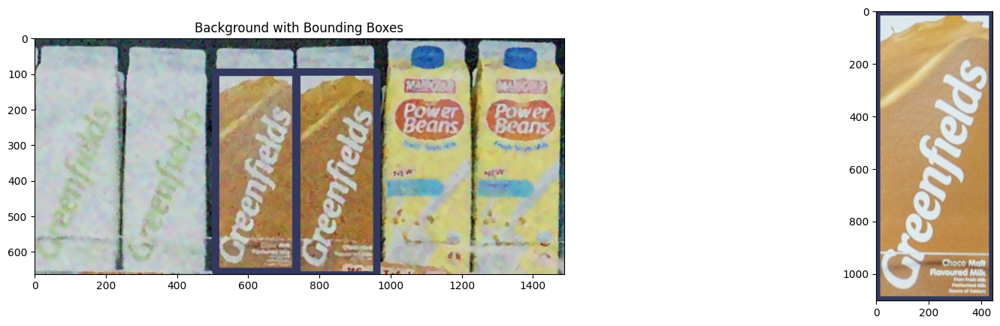

Product 21 - 1 instance found:
  Instance 0  [position: (586, 186), width: 248px, height: 702px]
Product 22 - 3 instance found:
  Instance 0  [position: (1133, 178), width: 251px, height: 741px]
  Instance 1  [position: (1404, 183), width: 250px, height: 702px]
  Instance 2  [position: (858, 180), width: 252px, height: 737px]


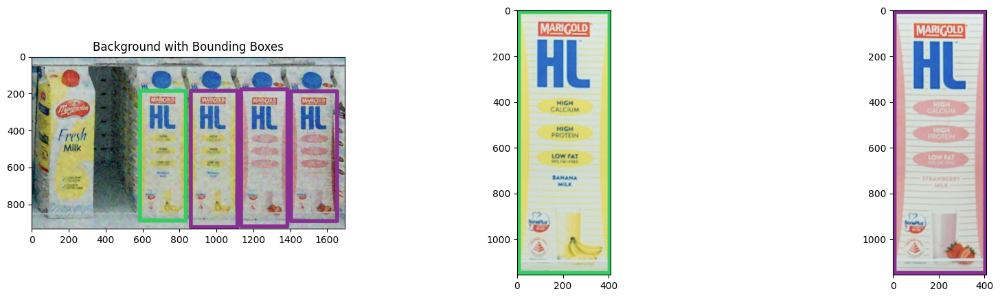

Product 17 - 4 instance found:
  Instance 0  [position: (75, 110), width: 191px, height: 507px]
  Instance 1  [position: (264, 126), width: 183px, height: 480px]
  Instance 2  [position: (461, 121), width: 191px, height: 488px]
  Instance 3  [position: (651, 125), width: 196px, height: 488px]
Product 23 - 4 instance found:
  Instance 0  [position: (265, 116), width: 183px, height: 490px]
  Instance 1  [position: (76, 110), width: 182px, height: 492px]
  Instance 2  [position: (652, 120), width: 192px, height: 493px]
  Instance 3  [position: (464, 116), width: 185px, height: 493px]
Product 24 - 4 instance found:
  Instance 0  [position: (645, 130), width: 199px, height: 514px]
  Instance 1  [position: (461, 126), width: 187px, height: 483px]
  Instance 2  [position: (263, 125), width: 185px, height: 483px]
  Instance 3  [position: (71, 122), width: 189px, height: 487px]
Product 25 - 2 instance found:
  Instance 0  [position: (1052, 127), width: 184px, height: 505px]
  Instance 1  [posit

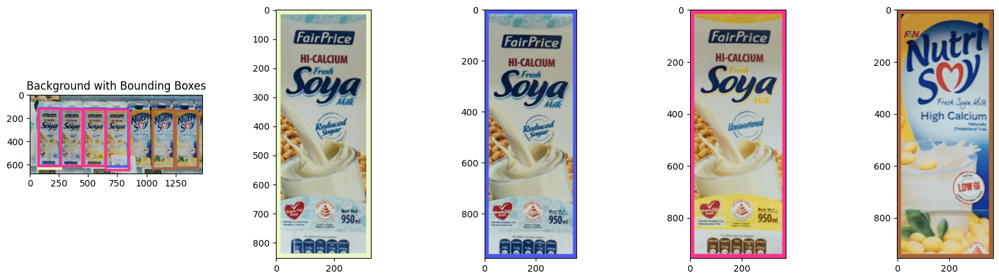

Product 18 - 2 instance found:
  Instance 0  [position: (6, 88), width: 264px, height: 599px]
  Instance 1  [position: (280, 101), width: 252px, height: 602px]
Product 26 - 2 instance found:
  Instance 0  [position: (14, 90), width: 246px, height: 593px]
  Instance 1  [position: (291, 101), width: 232px, height: 593px]


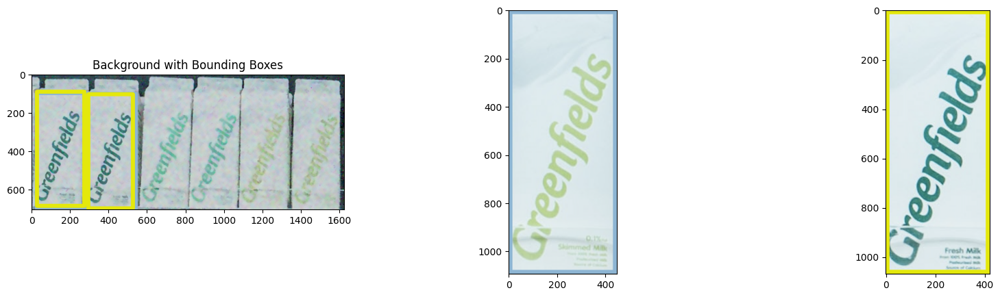

In [64]:
for scene_path in dn_scenes_b:
    dn_scene = cv2.imread(scene_path)
    dn_scene = cv2.cvtColor(dn_scene, cv2.COLOR_BGR2RGB)
    ret_arrays=[]
    scene_copy = dn_scene.copy()
    j=15
    for obj_path in objs_b:
        obj = cv2.imread(obj_path)
        obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)

        obj_copy=obj.copy()

        kp_scene=[]
        instances=[]

        track_b(scene_copy, obj_copy, kp_scene, instances, ret_arrays, j)

        j += 1  
    show_matches(background=scene_copy, instances=ret_arrays)

#TODO: complete the integration of show_matches function with this code


# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.